In [73]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img as load1,img_to_array
import PIL.Image
import tensorflow_hub as hub
import os

**Chonburi** is a province of Thailand located in eastern Thailand. Neighbouring provinces are Chachoengsao, Chanthaburi, and Rayong, while the Gulf of Thailand is to the west. Pattaya, a major tourism destination in Thailand, is located in Chonburi, along with Laem Chabang, the country's primary seaport. The population of the province has grown rapidly and now totals 1.4
million residents.

                                          The map of Chonburin in Thailand Map

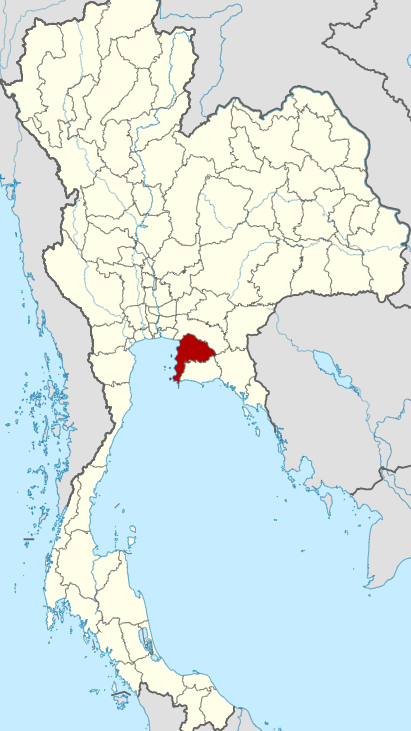

In [74]:
image = r'F:\01_Dataset\07 Generative Dataset\01 Building\01 Bangsean\Bangsean 4.jpg'
style = r'F:\01_Dataset\07 Generative Dataset\02 Background\style1.jpg'

In [75]:
bangsean_path = [r'F:\01_Dataset\07 Generative Dataset\01 Building\01 Bangsean' + '\\' + i for i in os.listdir(r'F:\01_Dataset\07 Generative Dataset\01 Building\01 Bangsean')]
chonburi_path = [r'F:\01_Dataset\07 Generative Dataset\01 Building\02 Chonburi' + '\\' + i for i in os.listdir(r'F:\01_Dataset\07 Generative Dataset\01 Building\02 Chonburi')]
sriracha_path = [r'F:\01_Dataset\07 Generative Dataset\01 Building\03 Sriracha' + '\\' + i for i in os.listdir(r'F:\01_Dataset\07 Generative Dataset\01 Building\03 Sriracha')]
pattaya_path =  [r'F:\01_Dataset\07 Generative Dataset\01 Building\04 Pattaya' + '\\' + i for i in os.listdir(r'F:\01_Dataset\07 Generative Dataset\01 Building\04 Pattaya')]
style = [r'F:\01_Dataset\07 Generative Dataset\02 Background' + '\\' + i for i in os.listdir(r'F:\01_Dataset\07 Generative Dataset\02 Background')]

The example of data which would be applied by neural style transfer to preduce the digital art is shown below.

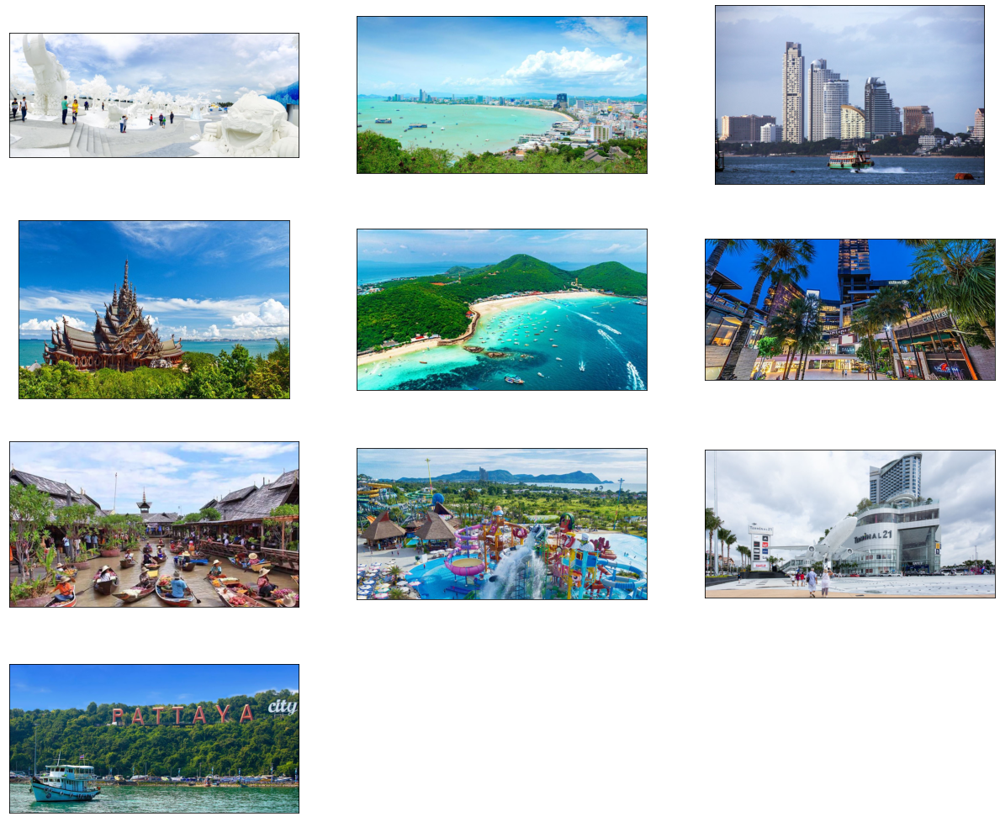

In [76]:
pattaya_example = []
for i in pattaya_path:
    g = load1(i)
    pattaya_example.append(g)
plt.figure(figsize=(21,18))
for i in range(10):
    plt.subplot(4,3,i+1)
    plt.imshow(pattaya_example[i])
    plt.xticks([])
    plt.yticks([])
plt.show()

# PART I MODEL DEVELOPMENT
In this project, I applied the current picture dataset with pretrained Arbitrary Image Stylization model from **Tensorflow Hub** to create the generatived digital arts the concepts of **"Neural Style Transfer"**. Neural style transfer is an optimization technique used to take two images—a content image and a style reference image (such as an artwork by a famous painter)—and blend them together so the output image looks like the content image, but “painted” in the style of the style reference image.

In [77]:
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')

In [78]:
def tensor_to_image(tensor):
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return PIL.Image.fromarray(tensor)

def load_img(path_to_img):
  max_dim = 512
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

def load(image,style):
    img = load_img(image)
    background = load_img(style)
    ny_style = hub_model(tf.constant(img), tf.constant(background))[0]
    return tensor_to_image(ny_style)

def visualize(image):
    b = load1(image)
    a = []
    for i in range(len(style)):
        background = style[i]
        a.append(load(image,background))    
    plt.figure(figsize=(21,18))
    plt.subplot(4,3,1)
    plt.imshow(b)
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('real picture')
    for i in range(10):
        plt.subplot(4,3,i+2)
        plt.imshow(a[i])
        plt.xticks([])
        plt.yticks([])
    plt.show()
   
def visualize_random(city):
    a = np.arange(len(city))
    np.random.shuffle(a)
    b = np.arange(len(style))
    np.random.shuffle(b)
    c = []
    for i,j in zip(a,b):
        image = city[i]
        background = style[j]
        c.append(load(image,background))
    plt.figure(figsize=(21,18))
    for i in range(10):
        plt.subplot(4,3,i+1)
        plt.imshow(c[i])
        plt.xticks([])
        plt.yticks([])
    plt.show()

# COULD YOU GUESS WHERE THE PICTURE IS ?

## DIGITAL MUSEUM ZONE I : CHONBURI CITY
**Chonburi** is the capital of Chonburi Province and Mueang Chonburi District in Thailand. It is about 100 km southeast of Bangkok, on the coast of the Gulf of Thailand. Its name means 'city of water'. Chonburi, along with other areas along the coast to Pattaya, forms a conurbation known as the Pattaya-Chonburi Metropolitan Area

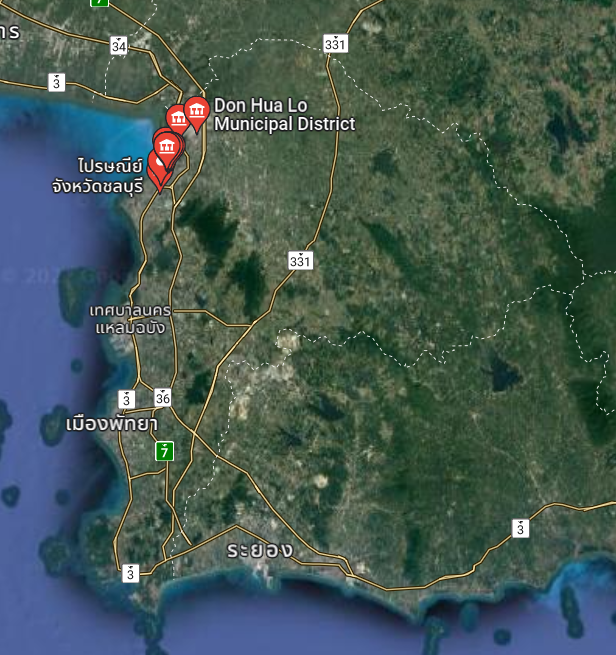

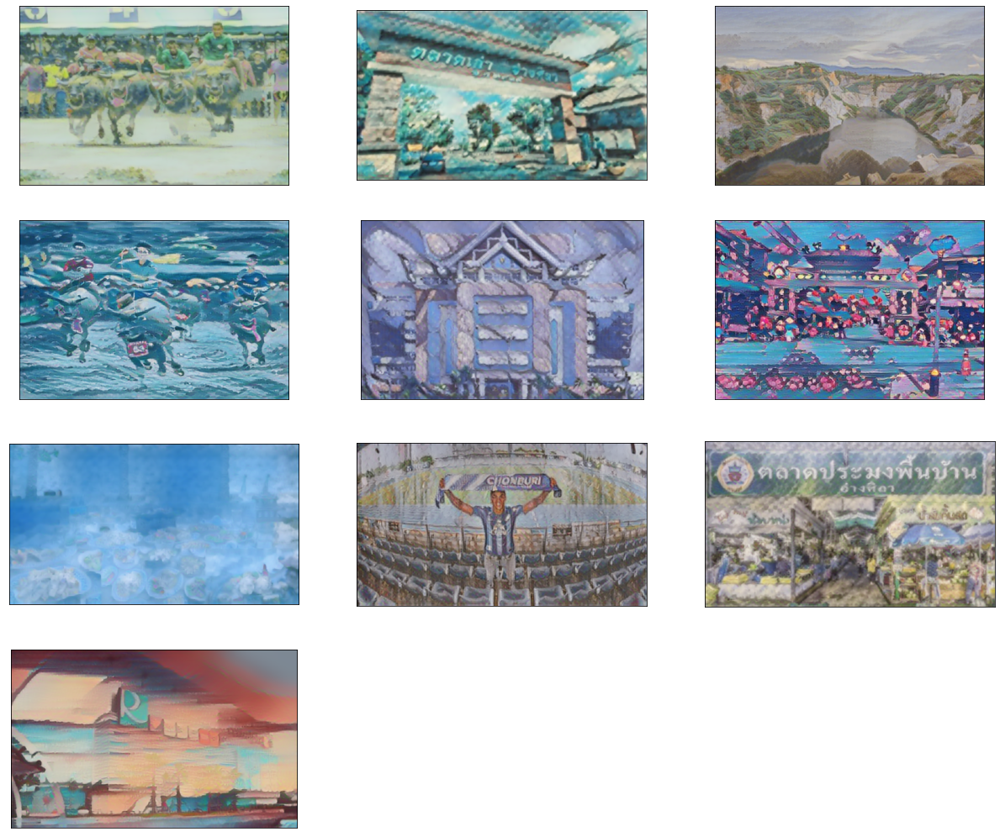

In [79]:
visualize_random(chonburi_path)

## DIGITAL MUSEUM ZONE II : BANGSEUN CITY
**BANGSEUN CITY** is Located approximately 13 kilometers from the city of Chonburi, this popular beach features seafood and drink vendors, deck chair rentals and fresh water bathing.
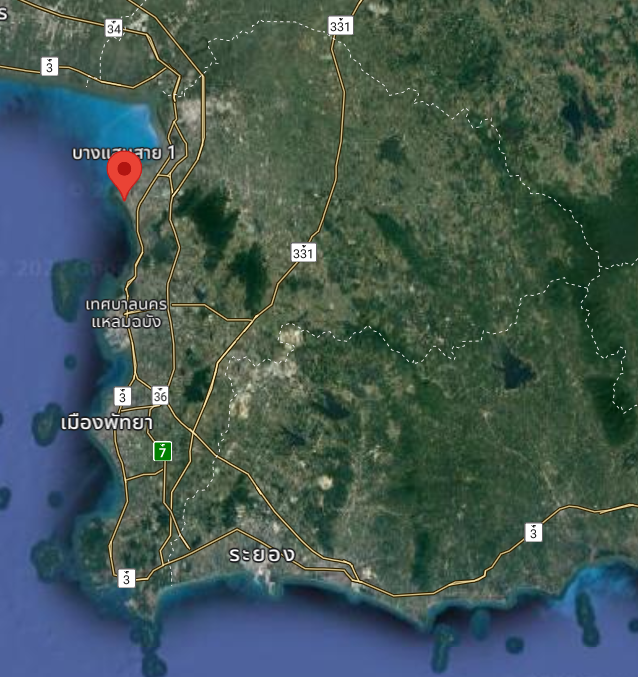

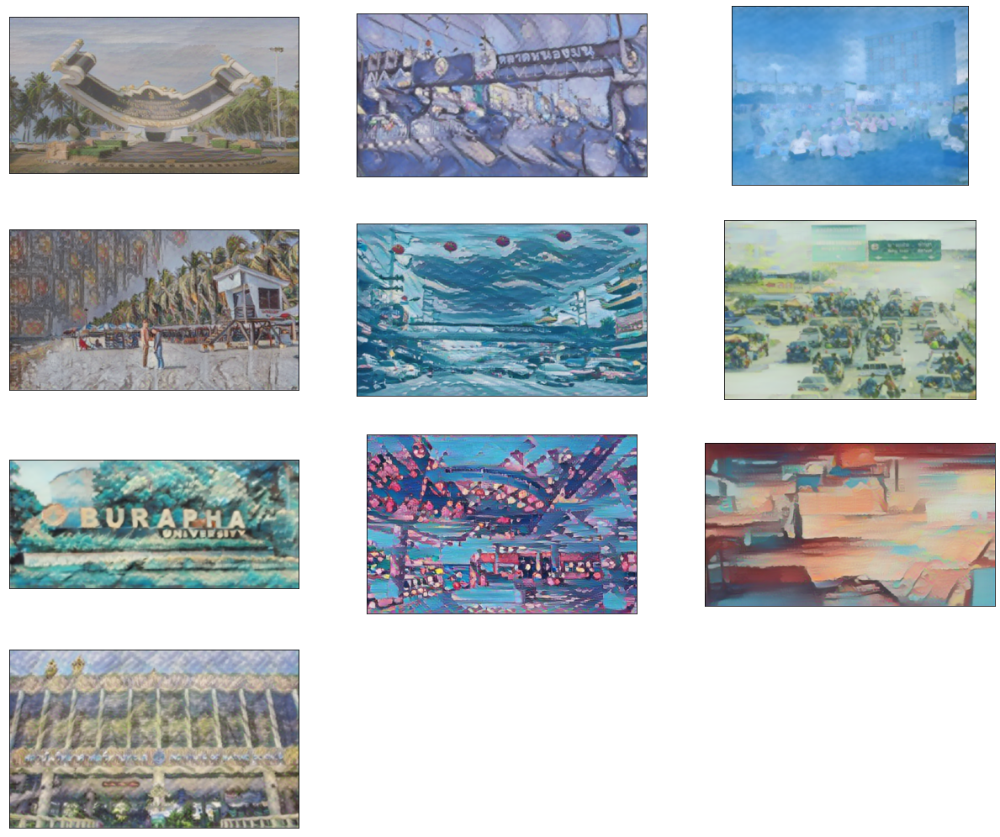

In [80]:
visualize_random(bangsean_path)

## DIGITAL MUSEUM ZONE III : SRIRACHA CITY
**Si Racha** is in an industrial zone consisting of manufacturing and shipping industries, supported by the port of Laem Chabang, 20th largest in the world. With Chonburi to the north and Pattaya, Bang Lamung township, Laem Chabang to the south, it forms the bulk of the economic zone of the eastern seaboard of Thailand, a fast-growing area that is second to only greater Bangkok in population and wealth.Due to its infrastructure, Laem Chabang and the eastern seaboard in general, is the nation's leading economic zone.

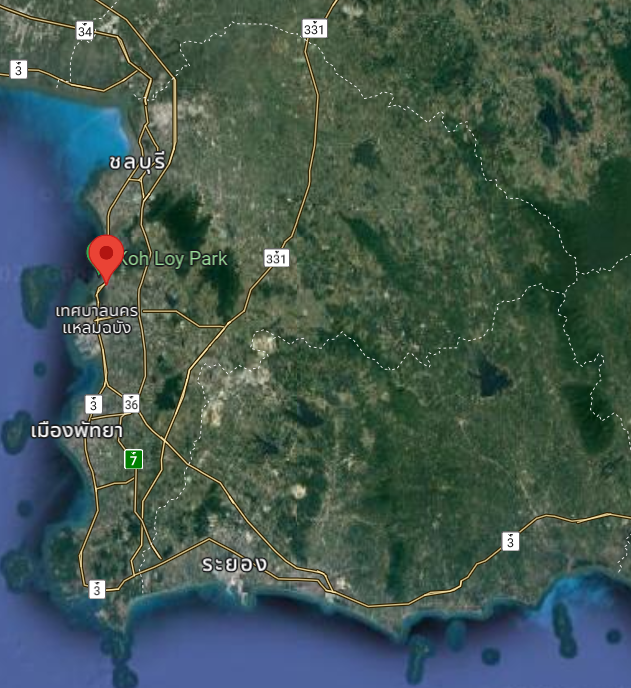

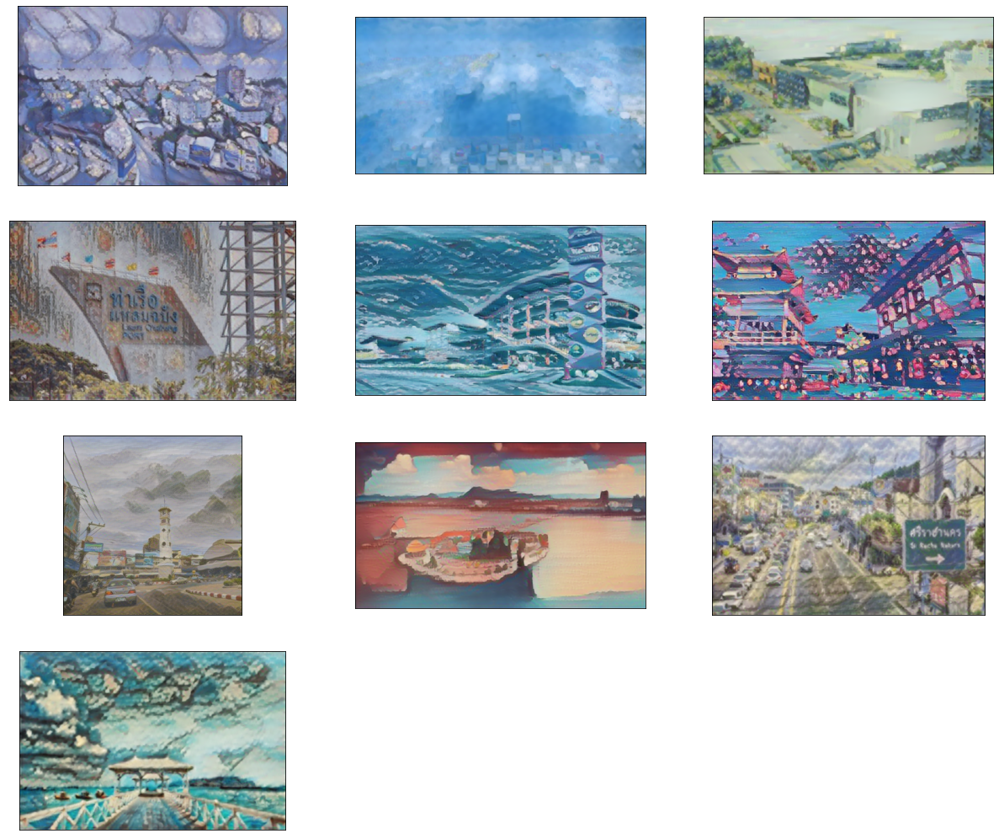

In [81]:
visualize_random(sriracha_path)

# DIGITAL MUSEUM ZONE IV : PATTAYA CITY
**Pattaya City**  is a self-governing municipal area which covers Tambon's Nong Prue and Na Klua and parts of Huai Yai and Nong Pla Lai. The city is in the industrial Eastern Seaboard zone and Pattaya is at the center of the Pattaya-Chonburi Metropolitan Area—a conurbation in Chonburi Province—with a population of roughly 1,000,000.

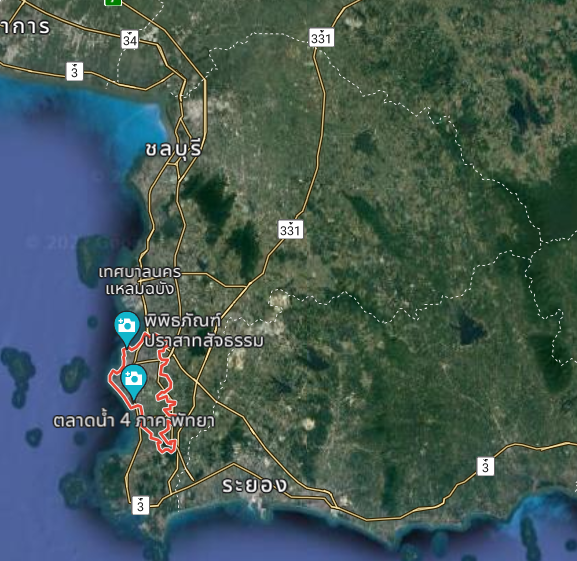

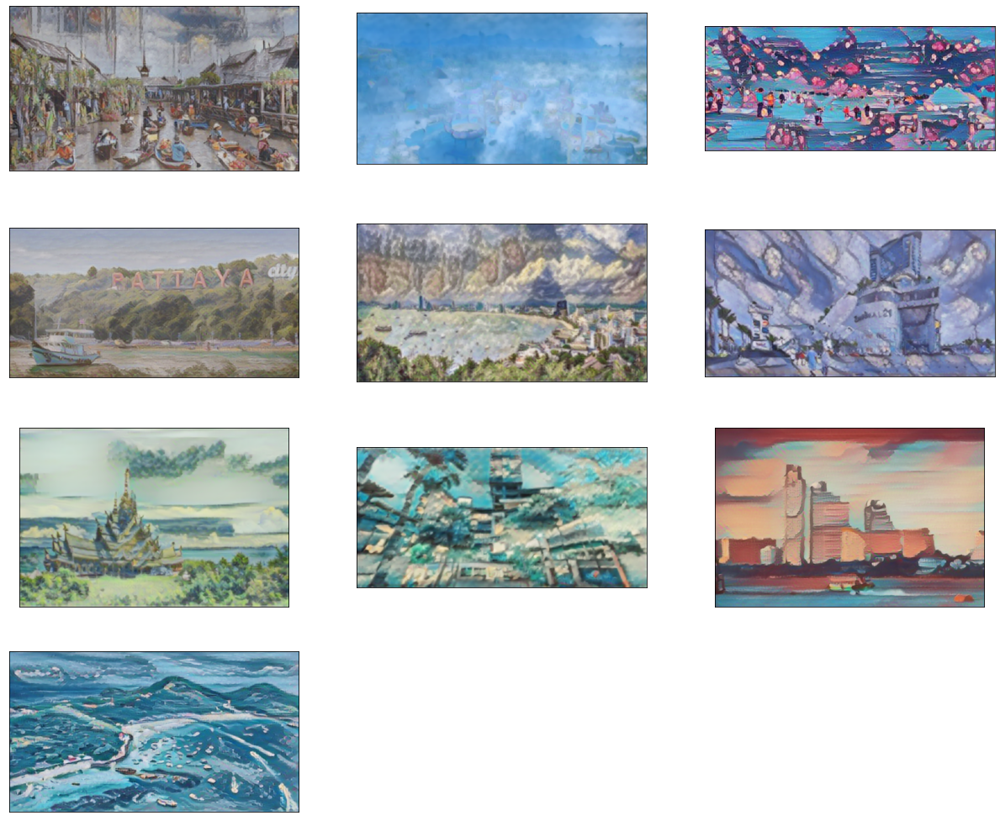

In [82]:
visualize_random(pattaya_path)